In [1]:
# ================================================================
# Cell 1 – Imports and path configuration
# ================================================================
from pathlib import Path
import sys

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------------------------------------------------------------
# Project paths
# ---------------------------------------------------------------
# This notebook lives in:  <project_root>/notebooks
NOTEBOOK_DIR = Path.cwd()
PROJECT_ROOT = NOTEBOOK_DIR.parent

# Make sure the project root is on sys.path so that 'sim_rl' can be imported
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

print("NOTEBOOK_DIR:", NOTEBOOK_DIR)
print("PROJECT_ROOT:", PROJECT_ROOT)
print("sys.path[0]:", sys.path[0])

# Now these imports should work
from sim_rl.cr3bp.constants import SYSTEMS, LAGRANGE_POINTS

# ---------------------------------------------------------------
# Scenario identifiers (used for physics constants)
# ---------------------------------------------------------------
SYSTEM_ID = "earth-moon"
LAGRANGE_ID = "L1"

mu = SYSTEMS[SYSTEM_ID]["mu"]
print(f"mu({SYSTEM_ID}) = {mu:.8f}")

# Base directory of robust runs for the Earth–Moon L1 3D scenario
RUNS_ROOT = PROJECT_ROOT / "sim_rl" / "training" / "runs_robust" / "earth-moon-L1-3D"

# Select a specific run folder (adjust if you use another run)
RUN_DIR = RUNS_ROOT / "run_20251209_114916"
ROLLOUT_DIR = RUN_DIR / "rollouts"

print(f"Rollout directory: {ROLLOUT_DIR}")


NOTEBOOK_DIR: c:\Users\hosan\Desktop\cr3bp_project_3d\notebooks
PROJECT_ROOT: c:\Users\hosan\Desktop\cr3bp_project_3d
sys.path[0]: c:\Users\hosan\Desktop\cr3bp_project_3d
mu(earth-moon) = 0.01215059
Rollout directory: c:\Users\hosan\Desktop\cr3bp_project_3d\sim_rl\training\runs_robust\earth-moon-L1-3D\run_20251209_114916\rollouts


[INFO] Found 78 rollout files.
[INFO] Plotting all rollouts from 1 to 78.


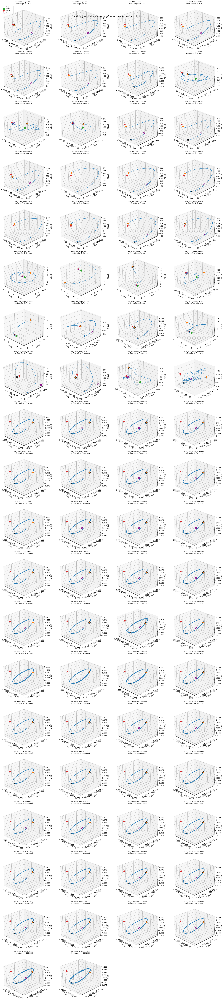

In [ ]:
# ================================================================
# Cell 2 – 3D training trajectories (rotating frame, ALL rollouts)
# ================================================================
import math
from mpl_toolkits.mplot3d import Axes3D  # needed for 3D projection

# ---------------------------------------------------------------
# Helper: list rollout CSVs
# ---------------------------------------------------------------
def list_rollout_files(rollout_dir: Path):
    """
    Return a list of rollout CSV paths sorted by name.
    Assumes filenames like 'sim_0001_steps_2048.csv'.
    """
    files = sorted(rollout_dir.glob("sim_*.csv"))
    return files

def parse_num_steps_from_name(path: Path) -> int | None:
    """
    Extract the number of training timesteps from a filename like
    'sim_0008_steps_16384.csv'. Returns None if parsing fails.
    """
    stem = path.stem  # e.g. 'sim_0008_steps_16384'
    parts = stem.split("_")
    try:
        return int(parts[-1])
    except Exception:
        return None

# ---------------------------------------------------------------
# Physics markers (rotating frame)
# ---------------------------------------------------------------
mu = SYSTEMS[SYSTEM_ID]["mu"]
primary1_pos = np.array([-mu, 0.0, 0.0])        # Earth
primary2_pos = np.array([1.0 - mu, 0.0, 0.0])   # Moon
L1_pos = LAGRANGE_POINTS[SYSTEM_ID][LAGRANGE_ID]

def set_equal_3d(ax, x, y, z):
    """Set equal aspect ratio for a 3D axis."""
    max_range = max(
        float(x.max() - x.min()),
        float(y.max() - y.min()),
        float(z.max() - z.min()),
    )
    mid_x = 0.5 * (float(x.max()) + float(x.min()))
    mid_y = 0.5 * (float(y.max()) + float(y.min()))
    mid_z = 0.5 * (float(z.max()) + float(z.min()))
    ax.set_xlim(mid_x - max_range / 2, mid_x + max_range / 2)
    ax.set_ylim(mid_y - max_range / 2, mid_y + max_range / 2)
    ax.set_zlim(mid_z - max_range / 2, mid_z + max_range / 2)

def add_bodies(ax, with_labels: bool = False):
    """Draw Earth, Moon and L1 markers in the rotating frame."""
    ax.scatter(
        [primary1_pos[0]], [primary1_pos[1]], [primary1_pos[2]],
        s=120, marker="o", color="tab:green",
        label="Earth" if with_labels else None, zorder=4,
    )
    ax.scatter(
        [primary2_pos[0]], [primary2_pos[1]], [primary2_pos[2]],
        s=70, marker="o", color="tab:red",
        label="Moon" if with_labels else None, zorder=4,
    )
    ax.scatter(
        [L1_pos[0]], [L1_pos[1]], [L1_pos[2]],
        s=90, marker="x", color="purple",
        label="L1" if with_labels else None, zorder=4,
    )

def add_start_end_markers(ax, x, y, z, with_labels: bool = False):
    """Mark start (circle) and end (diamond) of a trajectory."""
    ax.scatter(
        [x[0]], [y[0]], [z[0]],
        s=70, marker="o",
        edgecolor="black", facecolor="tab:blue",
        linewidths=1.0,
        label="Start" if with_labels else None,
        zorder=5,
    )
    ax.scatter(
        [x[-1]], [y[-1]], [z[-1]],
        s=70, marker="D",
        edgecolor="black", facecolor="tab:orange",
        linewidths=1.0,
        label="End" if with_labels else None,
        zorder=5,
    )

# ---------------------------------------------------------------
# Load ALL rollouts and plot
# ---------------------------------------------------------------
all_files = list_rollout_files(ROLLOUT_DIR)
if not all_files:
    raise RuntimeError(f"No rollout CSV files found in {ROLLOUT_DIR}")

n_files = len(all_files)
print(f"[INFO] Found {n_files} rollout files.")
print(f"[INFO] Plotting all rollouts from 1 to {n_files}.")

# Grid layout: 4 columns, as many rows as needed
n_cols = 4
n_rows = math.ceil(n_files / n_cols)

fig = plt.figure(figsize=(4.8 * n_cols, 4.2 * n_rows))

for idx_plot, csv_path in enumerate(all_files, start=1):
    df = pd.read_csv(csv_path)

    # Positions in rotating frame (absolute) – from rollout_policy_to_csv
    pos_cols = [c for c in df.columns if c.startswith("pos_rot_abs_")]
    if len(pos_cols) < 3:
        raise ValueError(f"Expected at least 3 position columns in {csv_path}, found {pos_cols}")

    x = df[pos_cols[0]].to_numpy()
    y = df[pos_cols[1]].to_numpy()
    z = df[pos_cols[2]].to_numpy()

    # Metadata for title
    num_steps = parse_num_steps_from_name(csv_path)
    steps_label = f"{num_steps:,}" if num_steps is not None else "unknown"

    ax = fig.add_subplot(n_rows, n_cols, idx_plot, projection="3d")

    ax.plot(x, y, z, lw=1.2, color="tab:blue", label="Trajectory")
    add_start_end_markers(ax, x, y, z, with_labels=False)
    add_bodies(ax, with_labels=(idx_plot == 1))

    set_equal_3d(ax, x, y, z)
    ax.set_xlabel("x [LU]")
    ax.set_ylabel("y [LU]")
    ax.set_zlabel("z [LU]")
    ax.set_title(f"{csv_path.stem}\n(train steps ≈ {steps_label})", fontsize=9)
    ax.view_init(elev=25, azim=135)

    if idx_plot == 1:
        ax.legend(loc="upper left", fontsize=8)

fig.suptitle("Training evolution – Rotating-frame trajectories (all rollouts)", fontsize=14)
plt.tight_layout()
plt.show()


[INFO] Found 78 rollout files.
[INFO] Plotting all rollouts (inertial frame) from 1 to 78.


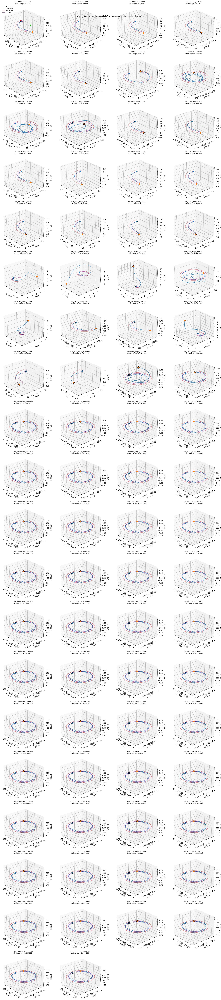

In [ ]:
# ================================================================
# Cell 3 – 3D training trajectories (INERTIAL frame, ALL rollouts)
# ================================================================
import math

# ---------------------------------------------------------------
# Helper: rotating → inertial transform
# ---------------------------------------------------------------
def rotating_to_inertial(x, y, z, t):
    """
    Rotating (synodic) frame → inertial frame.
    θ = t (normalized mean motion = 1), rotation about z-axis.
    """
    t = np.asarray(t, dtype=float)
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    z = np.asarray(z, dtype=float)

    cos_t = np.cos(t)
    sin_t = np.sin(t)

    x_I = cos_t * x - sin_t * y
    y_I = sin_t * x + cos_t * y
    z_I = z
    return x_I, y_I, z_I

# ---------------------------------------------------------------
# Physics markers (bodies in rotating frame at t=0)
# ---------------------------------------------------------------
mu = SYSTEMS[SYSTEM_ID]["mu"]
earth_rot = np.array([-mu, 0.0, 0.0])                    # Earth (rotating)
moon_rot  = np.array([1.0 - mu, 0.0, 0.0])               # Moon  (rotating)
L1_rot    = LAGRANGE_POINTS[SYSTEM_ID][LAGRANGE_ID]      # L1    (rotating)

def set_equal_3d(ax, x, y, z):
    """Set equal aspect ratio for a 3D axis."""
    max_range = max(
        float(x.max() - x.min()),
        float(y.max() - y.min()),
        float(z.max() - z.min()),
    )
    mid_x = 0.5 * (float(x.max()) + float(x.min()))
    mid_y = 0.5 * (float(y.max()) + float(y.min()))
    mid_z = 0.5 * (float(z.max()) + float(z.min()))
    ax.set_xlim(mid_x - max_range / 2, mid_x + max_range / 2)
    ax.set_ylim(mid_y - max_range / 2, mid_y + max_range / 2)
    ax.set_zlim(mid_z - max_range / 2, mid_z + max_range / 2)

def add_start_end_markers(ax, x, y, z, with_labels: bool = False):
    """Mark start (circle) and end (diamond) of a trajectory."""
    ax.scatter(
        [x[0]], [y[0]], [z[0]],
        s=70, marker="o",
        edgecolor="black", facecolor="tab:blue",
        linewidths=1.0,
        label="Start" if with_labels else None,
        zorder=5,
    )
    ax.scatter(
        [x[-1]], [y[-1]], [z[-1]],
        s=70, marker="D",
        edgecolor="black", facecolor="tab:orange",
        linewidths=1.0,
        label="End" if with_labels else None,
        zorder=5,
    )

def parse_num_steps_from_name(path: Path) -> int | None:
    stem = path.stem  # e.g. 'sim_0008_steps_16384'
    parts = stem.split("_")
    try:
        return int(parts[-1])
    except Exception:
        return None

def list_rollout_files(rollout_dir: Path):
    return sorted(rollout_dir.glob("sim_*.csv"))

# ---------------------------------------------------------------
# Load ALL rollouts and plot in inertial frame
# ---------------------------------------------------------------
all_files = list_rollout_files(ROLLOUT_DIR)
if not all_files:
    raise RuntimeError(f"No rollout CSV files found in {ROLLOUT_DIR}")

n_files = len(all_files)
print(f"[INFO] Found {n_files} rollout files.")
print(f"[INFO] Plotting all rollouts (inertial frame) from 1 to {n_files}.")

n_cols = 4
n_rows = math.ceil(n_files / n_cols)

fig = plt.figure(figsize=(4.8 * n_cols, 4.2 * n_rows))

for idx_plot, csv_path in enumerate(all_files, start=1):
    df = pd.read_csv(csv_path)

    # Time & rotating-frame position of satellite
    t = df["t"].to_numpy()
    pos_cols = [c for c in df.columns if c.startswith("pos_rot_abs_")]
    if len(pos_cols) < 3:
        raise ValueError(f"Expected at least 3 position columns in {csv_path}, found {pos_cols}")

    xr = df[pos_cols[0]].to_numpy()
    yr = df[pos_cols[1]].to_numpy()
    zr = df[pos_cols[2]].to_numpy()

    # Sat in inertial frame
    xI, yI, zI = rotating_to_inertial(xr, yr, zr, t)

    # Earth/Moon/L1 paths in inertial frame for this rollout
    earth_x_r = np.full_like(t, earth_rot[0])
    earth_y_r = np.full_like(t, earth_rot[1])
    earth_z_r = np.full_like(t, earth_rot[2])

    moon_x_r  = np.full_like(t, moon_rot[0])
    moon_y_r  = np.full_like(t, moon_rot[1])
    moon_z_r  = np.full_like(t, moon_rot[2])

    L1_x_r    = np.full_like(t, L1_rot[0])
    L1_y_r    = np.full_like(t, L1_rot[1])
    L1_z_r    = np.full_like(t, L1_rot[2])

    earth_x_I, earth_y_I, earth_z_I = rotating_to_inertial(earth_x_r, earth_y_r, earth_z_r, t)
    moon_x_I,  moon_y_I,  moon_z_I  = rotating_to_inertial(moon_x_r,  moon_y_r,  moon_z_r,  t)
    L1_x_I,    L1_y_I,    L1_z_I    = rotating_to_inertial(L1_x_r,    L1_y_r,    L1_z_r,    t)

    num_steps = parse_num_steps_from_name(csv_path)
    steps_label = f"{num_steps:,}" if num_steps is not None else "unknown"

    ax = fig.add_subplot(n_rows, n_cols, idx_plot, projection="3d")

    # Satellite trajectory
    ax.plot(xI, yI, zI, lw=1.2, color="tab:blue", label="Trajectory")
    add_start_end_markers(ax, xI, yI, zI, with_labels=False)

    # Earth/Moon/L1 trajectories for context
    ax.plot(earth_x_I, earth_y_I, earth_z_I, lw=1.0, color="tab:green", alpha=0.6, label="Earth path" if idx_plot == 1 else None)
    ax.plot(moon_x_I,  moon_y_I,  moon_z_I,  lw=1.0, color="tab:red",   alpha=0.6, label="Moon path"  if idx_plot == 1 else None)
    ax.plot(L1_x_I,    L1_y_I,    L1_z_I,    lw=1.0, color="purple",    alpha=0.6, label="L1 path"    if idx_plot == 1 else None)

    # Mark start of Earth/Moon/L1
    if idx_plot == 1:
        ax.scatter([earth_x_I[0]], [earth_y_I[0]], [earth_z_I[0]], s=60, color="tab:green")
        ax.scatter([moon_x_I[0]],  [moon_y_I[0]],  [moon_z_I[0]],  s=50, color="tab:red")
        ax.scatter([L1_x_I[0]],    [L1_y_I[0]],    [L1_z_I[0]],    s=70, color="purple", marker="x")

    # Axis limits based on all curves in this subplot
    x_all = np.concatenate([xI, earth_x_I, moon_x_I, L1_x_I])
    y_all = np.concatenate([yI, earth_y_I, moon_y_I, L1_y_I])
    z_all = np.concatenate([zI, earth_z_I, moon_z_I, L1_z_I])
    set_equal_3d(ax, x_all, y_all, z_all)

    ax.set_xlabel("x_I [LU]")
    ax.set_ylabel("y_I [LU]")
    ax.set_zlabel("z_I [LU]")
    ax.set_title(f"{csv_path.stem}\n(train steps ≈ {steps_label})", fontsize=9)
    ax.view_init(elev=25, azim=140)

    if idx_plot == 1:
        ax.legend(loc="upper left", fontsize=8)

fig.suptitle("Training evolution – Inertial-frame trajectories (all rollouts)", fontsize=14)
plt.tight_layout()
plt.show()
